In [1]:
%matplotlib inline
import morphs
import numpy as np
import matplotlib.pyplot as plt

from morphs.utils.spikes import create_neural_rep

/usr/local/anaconda/envs/morphs/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
accuracies, cluster_accuracies = morphs.load.cluster_accuracies()
good_recs = morphs.data.accuracies.good_recs(cluster_accuracies)

In [3]:
# try to find nice block used below, else use last one found
for block_path in morphs.paths.blocks():
    if 'Pen01_Lft_AP2500_ML750__Site04_Z2300__B1101_cat_P01_S04_3' in block_path:
        break
subj = morphs.data.parse.bird_id(block_path)
good_clusters = morphs.data.accuracies.good_clusters(cluster_accuracies[block_path])

In [4]:
spikes = morphs.load.ephys_data(block_path, good_clusters=good_clusters, collapse_endpoints=True)
spikes['end'] = spikes['stim_id'].isin(list('abcdefghi'))

/usr/local/anaconda/envs/morphs/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


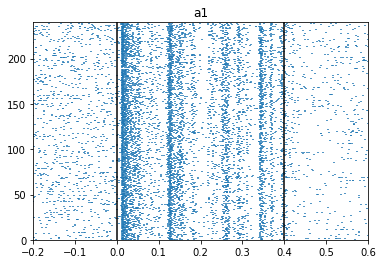

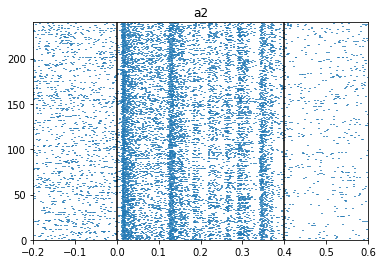

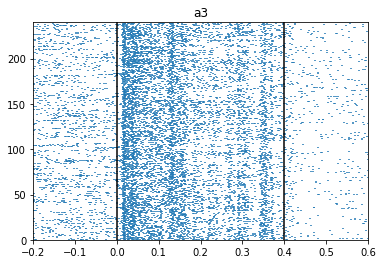

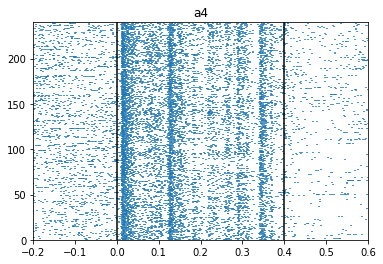

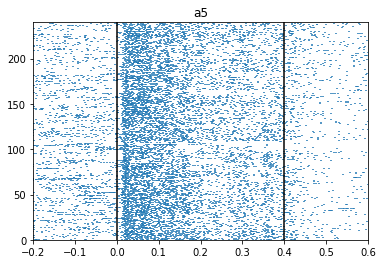

...

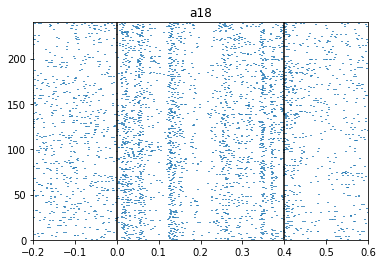

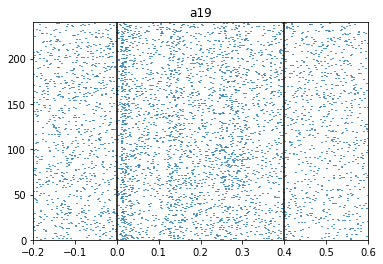

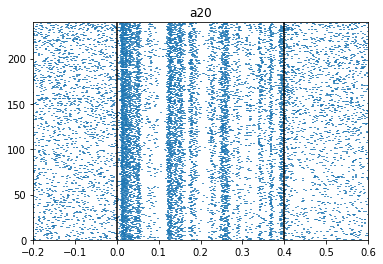

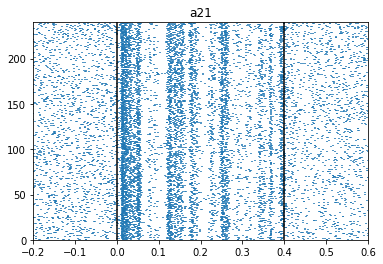

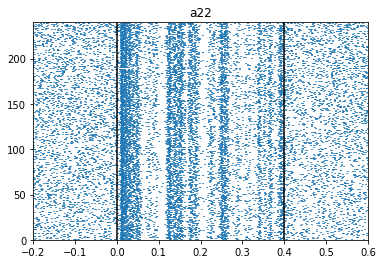

In [5]:
# Rasters for all units of the above block, for A motif
for clusterID, cluster_group in spikes[spikes['end']].groupby('cluster'):
    for motif, motif_group in cluster_group.groupby('stim_id'):
        f = plt.figure()
        _ = plt.eventplot([pres_group.values for pres, pres_group in motif_group.groupby('stim_presentation')["stim_aligned_time"]], alpha=1)
        ax = plt.gca()
        ax.set_xlim(-0.2, .6)
        ax.set_ylim(0, len(motif_group['stim_presentation'].unique()))
        ax.axvline(0, color='k')
        ax.axvline(0.4, color='k')
        ax.set_title(motif + str(clusterID))
        break
#     break

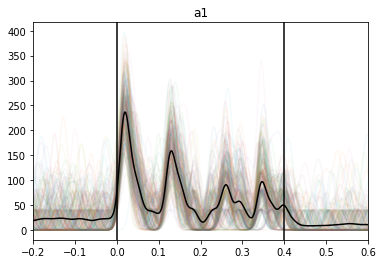

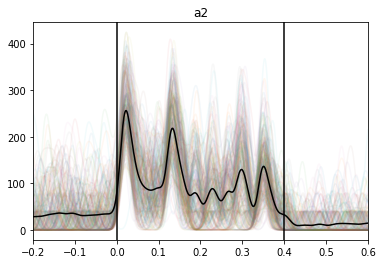

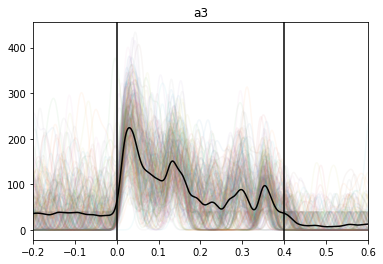

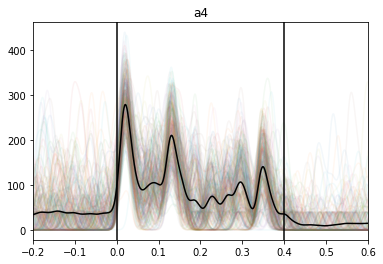

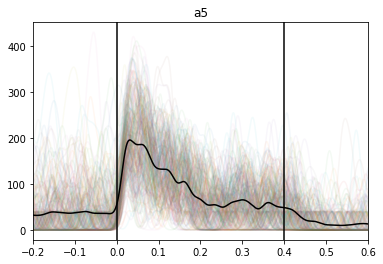

...

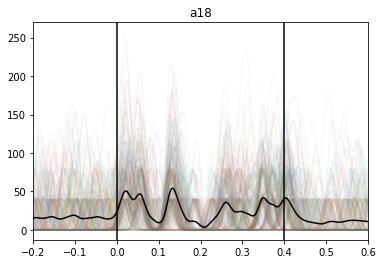

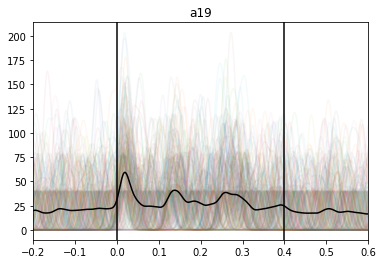

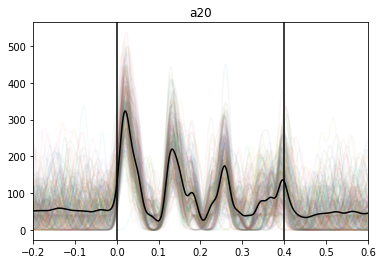

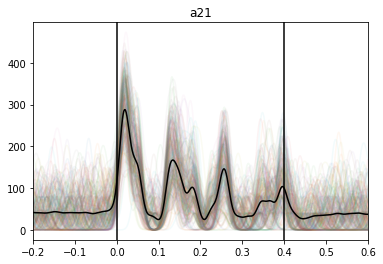

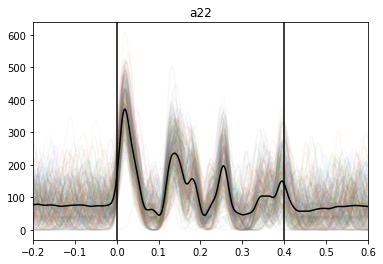

In [6]:
# calculating mean psth for all units of the recording by averaging each individual gaussian convolved spike train
# black line is mean psth
# only motif A again
t = np.linspace(-.2, .6, 1000)
for clusterID, cluster_group in spikes[spikes['end']].groupby('cluster'):
    for motif, motif_group in cluster_group.groupby('stim_id'):
        f = plt.figure()
        X, _ = create_neural_rep(motif_group, t=t)
        plt.plot(t, X.T, alpha=.05);
        plt.plot(t, np.mean(X.T, axis=1), 'k');
        ax = plt.gca()
        ax.set_xlim(-0.2, .6)
        ax.axvline(0, color='k')
        ax.axvline(0.4, color='k')
        ax.set_title(motif + str(clusterID))
        break

In [7]:
psth = morphs.load.single_unit_templates()
t = np.linspace(-.2, .6, 1000)

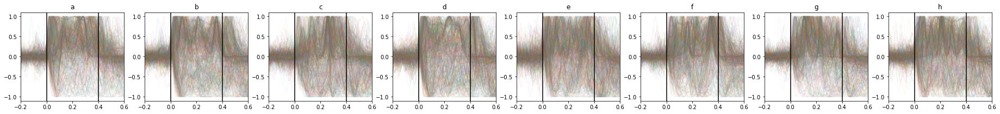

In [8]:
# mean psth for all units, from all blocks, plotted on top of each other
# columns are each motif
motifs = 'abcdefgh'

f, axes = plt.subplots(1, len(motifs), figsize=(len(motifs) * 4, 3), squeeze=True)
ax_map = {m:ax for m, ax in zip(motifs, axes)}
for block_path in psth:
    for clusterID in psth[block_path]:
        for motif in psth[block_path][clusterID]:
            if not motif in motifs:
                continue
            # normalize psth template
            template = psth[block_path][clusterID][motif]
            template -= np.mean(template[t < -.1])
            template /= np.max(np.abs(template))
            ax_map[motif].plot(t, template, alpha=.05)
for motif in ax_map:
    ax = ax_map[motif]
    ax.set_xlim(-0.2, .6)
    ax.axvline(0, color='k')
    ax.axvline(0.4, color='k')
    ax.set_title(motif)

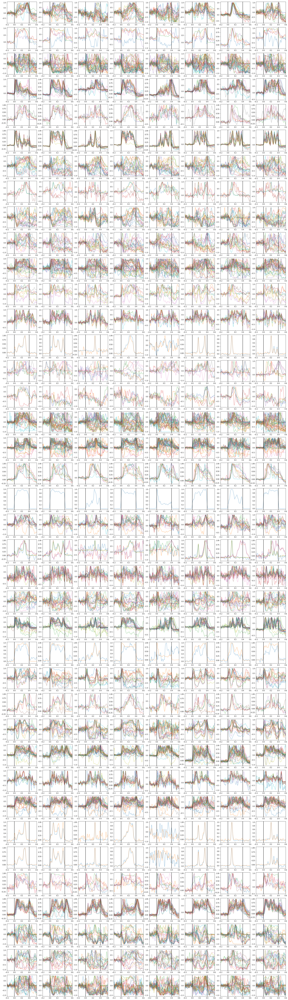

In [9]:
# mean psth all units
# columns are motifs abcdefgh
# rows are different recording sites
motifs = 'abcdefgh'

f, axes = plt.subplots(len(psth), len(motifs), figsize=(len(motifs) * 4, len(psth) * 3), squeeze=False)
motif_map = {m:idx for m, idx in zip(motifs, range(len(motifs)))}
block_map = {b:idx for b, idx in zip(psth.keys(), range(len(psth.keys())))}
for block_path in psth:
    for clusterID in psth[block_path]:
        for motif in psth[block_path][clusterID]:
            if not motif in motifs:
                continue
            # normalize psth template
            template = psth[block_path][clusterID][motif]
            template -= np.mean(template[t < -.1])
            template /= np.max(np.abs(template))
            axes[block_map[block_path], motif_map[motif]].plot(t, template, alpha=.5)
for axl in axes:
    for ax in axl:
        ax.set_xlim(-0.2, .6)
        ax.axvline(0, color='k')
        ax.axvline(0.4, color='k')

Figure notes:
- Spectrogram
- waveform
- for a given unit, several motif templates
- for a given recording/for all units, smoothed FR
- color bar representation
- morph from a to b, b to c, ... etc